# VAME — HPO & Egocentric Retraining

**Model:** Open-Field-Test / RNN-VAE (GRU) | 44 sessions | 27 keypoints (47 features after exclusions)

**Status:** Egocentric HPO complete. Best params identified (Trial 5, test loss = 2321.16 on egocentric data).

**Workflow summary:**
1. Diagnosed baseline model (KL annealing collapse → poor latent space)
2. Ran Optuna HPO (10 trials × 30 ep) on raw data → Trial 6: loss 702 vs baseline 1274 (-45%)
3. Identified egocentric preprocessing as necessary (mixed behaviors in motifs)
4. Ran Optuna HPO (10 trials × 30 ep) on egocentric data → Trial 5: loss 2321 (new baseline)
5. **Next:** Run Section 8 cell — preprocess → trainset → full 500-epoch train with best params

---

In [ ]:
# ── Global setup — run this cell first after any kernel restart ──────────────
import os, copy, shutil, time
import numpy as np
import yaml
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
from pathlib import Path
from datetime import datetime, timedelta

VAME_ROOT   = Path(r"C:/Users/zuria/Kaplan/Vame")
CONFIG_PATH = VAME_ROOT / "Open-Field-Test" / "config.yaml"
LOSS_DIR    = VAME_ROOT / "Open-Field-Test" / "model" / "model_losses"

os.chdir(VAME_ROOT)
print(f"Working directory: {os.getcwd()}")


---
## Section 1 — Baseline Loss Analysis

Load the original model's loss arrays and visualize training dynamics.

**Finding:** KL annealing completed at epoch 6 (annealtime=4, kl_start=2), causing premature latent
space collapse. The model plateaued at epoch 76/126 with best total test loss = 1276.
Future prediction loss dominated (3.7× total test), indicating the model prioritised prediction
over reconstruction. These diagnoses motivated the HPO search.

In [ ]:
# ── Load original model loss arrays and summarise training dynamics ──────────
# All arrays are 1D (one value per epoch) except mse_test_scalar which is a
# 0D scalar — VAME overwrites it each epoch so it only holds the final value.

loss_files = {
    "mse_train":       "mse_train_losses_VAME.npy",
    "train_total":     "train_losses_VAME.npy",
    "test_total":      "test_losses_VAME.npy",
    "kl":              "kl_losses_VAME.npy",
    "fut":             "fut_losses_VAME.npy",
    "kmeans":          "kmeans_losses_VAME.npy",
    "weight":          "weight_values_VAME.npy",
    "mse_test_scalar": "mse_test_losses_VAME.npy",  # 0D — final epoch only
}

losses = {}
for key, fname in loss_files.items():
    fpath = LOSS_DIR / fname
    if fpath.exists():
        arr = np.load(fpath)
        losses[key] = arr

# Key metrics
test_total = losses["test_total"]
mse_train  = losses["mse_train"]
epochs     = np.arange(1, len(test_total) + 1)

best_epoch = int(np.argmin(test_total)) + 1
best_loss  = float(test_total[best_epoch - 1])
final_mse  = float(losses["mse_test_scalar"]) if "mse_test_scalar" in losses else None

# Detect plateau: last epoch where improvement exceeded 1% threshold
threshold, running_min, plateau_epoch = best_loss * 0.01, test_total[0], best_epoch
for i, v in enumerate(test_total):
    if v < running_min - threshold:
        running_min, plateau_epoch = v, i + 1

print(f"Best total test loss : {best_loss:.1f}  @ epoch {best_epoch}")
if final_mse:
    print(f"Final test MSE       : {final_mse:.1f}  (0D scalar)")
print(f"Plateau began        : epoch {plateau_epoch}")
print(f"Total epochs trained : {len(test_total)}")

# ── 4-panel loss plot ─────────────────────────────────────────────────────────
fig = plt.figure(figsize=(16, 12))
gs  = gridspec.GridSpec(2, 2, figure=fig, hspace=0.38, wspace=0.32)

ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(epochs, mse_train,  label="MSE train",       color="steelblue", linewidth=1.2)
ax1.plot(epochs, test_total, label="Total test loss", color="tomato",    linewidth=1.2)
ax1.axvline(best_epoch,    color="green",  linestyle="--", linewidth=1, label=f"Best ({best_epoch})")
ax1.axvline(plateau_epoch, color="orange", linestyle=":",  linewidth=1, label=f"Plateau ({plateau_epoch})")
ax1.set_title("Train MSE vs Total Test Loss"); ax1.set_xlabel("Epoch"); ax1.set_ylabel("Loss")
ax1.legend(fontsize=8); ax1.grid(True, alpha=0.3)

ax2 = fig.add_subplot(gs[0, 1])
if "fut" in losses:
    fut = losses["fut"]
    ax2.plot(np.arange(1, len(fut)+1), fut, color="purple", linewidth=1.2)
    ax2.axvline(best_epoch, color="green", linestyle="--", linewidth=1)
    ratio = fut[-1] / test_total[-1]
    ax2.text(0.05, 0.95, f"fut/test_total: {ratio:.2f}", transform=ax2.transAxes,
             fontsize=8, va="top", bbox=dict(boxstyle="round", facecolor="lavender", alpha=0.8))
    ax2.set_title("Future Prediction Loss"); ax2.set_xlabel("Epoch"); ax2.grid(True, alpha=0.3)

ax3 = fig.add_subplot(gs[1, 0])
if "kl" in losses:
    kl = losses["kl"]
    ax3.plot(np.arange(1, len(kl)+1), kl, color="darkorange", linewidth=1.2, label="KL loss")
    if "weight" in losses:
        w = losses["weight"]
        ax3b = ax3.twinx()
        ax3b.plot(np.arange(1, len(w)+1), w, color="gray", linestyle="--", linewidth=1, label="KL weight")
        ax3b.set_ylabel("KL weight (0→1)")
    ax3.set_title("KL Loss + Annealing Schedule"); ax3.set_xlabel("Epoch"); ax3.grid(True, alpha=0.3)

ax4 = fig.add_subplot(gs[1, 1])
if "kmeans" in losses:
    km = losses["kmeans"]
    ax4.plot(np.arange(1, len(km)+1), km, color="teal", linewidth=1.2)
    ax4.set_title("Kmeans Loss"); ax4.set_xlabel("Epoch"); ax4.grid(True, alpha=0.3)

plt.suptitle("Baseline Model — Loss Analysis", fontsize=14, fontweight="bold")
plt.savefig(VAME_ROOT / "vame_loss_analysis.png", dpi=150, bbox_inches="tight")
plt.show()

# ── Summary table ─────────────────────────────────────────────────────────────
print("\n" + "=" * 60)
print("LOSS SUMMARY TABLE")
print("=" * 60)
print(f"{'Loss':<20} {'Min':>10} {'@ Epoch':>10} {'Final':>10}")
print("-" * 60)
for key, arr in losses.items():
    if arr.ndim == 0:
        print(f"{key:<20} {'(scalar)':>10} {'—':>10} {float(arr):>10.2f}")
    else:
        print(f"{key:<20} {arr.min():>10.2f} {int(np.argmin(arr))+1:>10d} {arr[-1]:>10.2f}")
print("=" * 60)

print("\nDiagnosis flags:")
if "weight" in losses:
    above = np.where(losses["weight"] >= 0.99)[0]
    if len(above):
        print(f"  [!] KL annealing reached 1.0 at epoch {int(above[0])+1} — too early (annealtime=4, kl_start=2)")
if "fut" in losses:
    ratio = losses["fut"][-1] / test_total[-1]
    if ratio > 0.5:
        print(f"  [!] Future loss / total test = {ratio:.2f} — prediction term dominates")
if plateau_epoch < len(test_total) * 0.5:
    print(f"  [!] Plateau at epoch {plateau_epoch}/{len(test_total)} — model stopped improving early")


---
## Section 2 — Optuna HPO (non-egocentric data)

Searched over 8 hyperparameters using Bayesian optimisation (TPE sampler). Each trial trained
for 30 epochs. 10 trials total, persisted to `vame_hpo.db`.

**Note:** This HPO ran on the original (non-egocentric) data. The best params found here were
later used as a starting point for the egocentric retraining (Section 6).

In [ ]:
# ── HPO setup: load base config and back up the existing best model ──────────
import optuna
import vame
from optuna.samplers import TPESampler

with open(CONFIG_PATH, "r") as f:
    base_config = yaml.safe_load(f)
base_config["project_path"] = str(VAME_ROOT / "Open-Field-Test")
print(f"Config loaded.  num_features={base_config['num_features']}  zdims={base_config['zdims']}")

# Back up the trained model before HPO overwrites it each trial
best_model_dir = VAME_ROOT / "Open-Field-Test" / "model" / "best_model"
backup_dir     = VAME_ROOT / "Open-Field-Test" / "model" / "best_model_backup"
if best_model_dir.exists():
    if backup_dir.exists():
        print(f"Backup already exists at {backup_dir} — skipping (delete manually for a fresh backup).")
    else:
        shutil.copytree(best_model_dir, backup_dir)
        print(f"Backed up best_model → {backup_dir}")
else:
    print(f"WARNING: best_model not found at {best_model_dir}")


In [ ]:
# ── HPO objective function ────────────────────────────────────────────────────
# Trains for 30 epochs with the sampled hyperparams and returns the best test loss.
# Each trial writes to Open-Field-Test/model/best_model — the study saves the best
# trial's model to best_trial_model/ for safekeeping.

BEST_TRIAL_DIR = VAME_ROOT / "Open-Field-Test" / "model" / "best_trial_model"

def objective(trial):
    config = copy.deepcopy(base_config)

    config["zdims"]            = trial.suggest_int("zdims", 15, 50)
    config["learning_rate"]    = trial.suggest_float("lr", 1e-4, 2e-3, log=True)
    config["beta"]             = trial.suggest_float("beta", 0.1, 3.0, log=True)
    config["annealtime"]       = trial.suggest_int("annealtime", 10, 50)
    config["kl_start"]         = trial.suggest_int("kl_start", 1, 10)
    dropout                    = trial.suggest_float("dropout", 0.0, 0.3)
    config["dropout_encoder"]  = dropout
    config["dropout_rec"]      = dropout
    config["dropout_pred"]     = dropout
    config["prediction_steps"] = trial.suggest_int("prediction_steps", 5, 20)
    h                          = trial.suggest_categorical("hidden_size", [128, 256, 512])
    config["hidden_size_layer_1"] = config["hidden_size_layer_2"] = h
    config["hidden_size_rec"]     = config["hidden_size_pred"]    = h
    config["max_epochs"]          = 30
    config["model_convergence"]   = 30

    print(f"\n--- Trial {trial.number} | zdims={config['zdims']}, lr={config['learning_rate']:.5f}, "
          f"beta={config['beta']:.3f}, annealtime={config['annealtime']}, "
          f"kl_start={config['kl_start']}, dropout={dropout:.3f}, "
          f"hidden={h}, pred_steps={config['prediction_steps']} ---")

    vame.train_model(config=config)

    loss_path = VAME_ROOT / "Open-Field-Test" / "model" / "model_losses"
    test_arr  = np.load(loss_path / "test_losses_VAME.npy")
    best_loss = float(np.min(test_arr))
    print(f"    -> best_test_loss={best_loss:.2f}")

    # Save best trial's model files
    try:
        if study.best_trial.number == trial.number:
            src = VAME_ROOT / "Open-Field-Test" / "model" / "best_model"
            if src.exists():
                if BEST_TRIAL_DIR.exists():
                    shutil.rmtree(BEST_TRIAL_DIR)
                shutil.copytree(src, BEST_TRIAL_DIR)
    except Exception:
        pass

    return best_loss


In [ ]:
# ── Create (or resume) study and run HPO ─────────────────────────────────────
# SQLite persistence means runs can be interrupted and resumed safely.
# Each trial takes ~1-1.5 hours; 10 trials ≈ 10-15 hours overnight.

DB_PATH    = VAME_ROOT / "vame_hpo.db"
STUDY_NAME = "vame_hpo"

study = optuna.create_study(
    study_name=STUDY_NAME,
    direction="minimize",
    sampler=TPESampler(seed=42),
    storage=f"sqlite:///{DB_PATH}",
    load_if_exists=True,
)

existing = len(study.trials)
print(f"Study '{STUDY_NAME}' loaded. Existing trials: {existing}")
if existing > 0:
    print(f"Best so far: {study.best_value:.2f} (trial {study.best_trial.number})")

N_TRIALS  = 10
remaining = N_TRIALS - len([t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE])
print(f"Completed: {N_TRIALS - remaining}/{N_TRIALS} — running {remaining} more.")

if remaining > 0:
    study.optimize(objective, n_trials=remaining, show_progress_bar=True)
else:
    print("All trials complete — proceed to Section 3 results.")


---
## Section 3 — HPO Results (non-egocentric)

**Finding:** Trial 6 was the clear winner with test loss 702.04 at 30 epochs — a 45% improvement
over the baseline best of 1274.

Top patterns across winning trials:
- **Long annealing:** annealtime 25–48 (vs default 4) — prevents early KL collapse
- **Large zdims:** 37–49 (vs default 30) — richer latent representation
- **Dropout:** 0.1–0.3 (vs default 0) — regularisation helps
- **High hidden size:** 256–512 (vs default 256)

Best trial 6 params: zdims=49, lr=0.00102, beta=2.44, annealtime=46, kl_start=6,
dropout=0.277, hidden=512, prediction_steps=6.

In [ ]:
# ── Load HPO results, show sorted table and parameter importance plots ────────
study = optuna.load_study(study_name="vame_hpo", storage=f"sqlite:///{VAME_ROOT / 'vame_hpo.db'}")
complete = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]
print(f"Complete trials : {len(complete)}")
if complete:
    print(f"Best total test loss : {study.best_value:.2f}  (trial {study.best_trial.number})")

# Sorted results table
rows = [{"trial": t.number, "test_mse": round(t.value, 2), **t.params}
        for t in sorted(complete, key=lambda x: x.value)]
print("\n" + pd.DataFrame(rows).to_string(index=False))

# Optuna visualisations
try:
    from optuna.visualization.matplotlib import plot_param_importances, plot_optimization_history
    fig1, ax1 = plt.subplots(figsize=(8, 5))
    plot_optimization_history(study)
    ax1.axhline(1274, color="red", linestyle="--", label="Baseline best (1274)")
    ax1.legend(); plt.tight_layout()
    plt.savefig(VAME_ROOT / "vame_hpo_history.png", dpi=150); plt.show()

    fig2, ax2 = plt.subplots(figsize=(8, 5))
    plot_param_importances(study)
    plt.tight_layout()
    plt.savefig(VAME_ROOT / "vame_hpo_importance.png", dpi=150); plt.show()
except ImportError:
    from optuna.visualization import plot_param_importances, plot_optimization_history
    plot_optimization_history(study).show()
    plot_param_importances(study).show()

# Recommended changes vs original defaults
DEFAULTS = {"zdims": 30, "lr": 5e-4, "beta": 1.0, "annealtime": 4,
            "kl_start": 2, "dropout": 0.0, "prediction_steps": 15, "hidden_size": 256}
best_p = study.best_trial.params
print("\n" + "=" * 58)
print("RECOMMENDED CHANGES  (best trial vs original defaults)")
print("=" * 58)
print(f"{'Parameter':<22} {'Default':>10} {'Best':>10} {'Changed?':>8}")
print("-" * 58)
for k, cur in DEFAULTS.items():
    b = best_p.get(k, cur)
    print(f"{k:<22} {str(cur):>10} {str(b):>10} {'YES' if str(b)!=str(cur) else '-':>8}")
print("=" * 58)


In [ ]:
# ── Apply non-egocentric HPO best params and retrain for 500 epochs ──────────
# This retrain confirmed the HPO improvement: 704.16 best loss at 50 epochs
# vs baseline 1276 at 76 epochs — 44.8% improvement.
# Note: this was later superseded by the egocentric retraining (Section 6+).
import vame

with open(CONFIG_PATH, "r") as f:
    final_config = yaml.safe_load(f)
final_config["project_path"] = str(VAME_ROOT / "Open-Field-Test")

best = study.best_trial.params
final_config["zdims"]               = best["zdims"]
final_config["learning_rate"]       = best["lr"]
final_config["beta"]                = best["beta"]
final_config["annealtime"]          = best["annealtime"]
final_config["kl_start"]            = best["kl_start"]
final_config["dropout_encoder"]     = best["dropout"]
final_config["dropout_rec"]         = best["dropout"]
final_config["dropout_pred"]        = best["dropout"]
final_config["prediction_steps"]    = best["prediction_steps"]
final_config["hidden_size_layer_1"] = best["hidden_size"]
final_config["hidden_size_layer_2"] = best["hidden_size"]
final_config["hidden_size_rec"]     = best["hidden_size"]
final_config["hidden_size_pred"]    = best["hidden_size"]
final_config["max_epochs"]          = 500
final_config["model_convergence"]   = 50

ts = datetime.now().strftime("%Y%m%d_%H%M%S")
shutil.copy2(CONFIG_PATH, CONFIG_PATH.parent / f"config_backup_{ts}.yaml")

with open(CONFIG_PATH, "w") as f:
    yaml.dump(final_config, f, default_flow_style=False, sort_keys=False)
print(f"Config updated with Trial {study.best_trial.number} params.")

vame.train_model(config=final_config)


---
## Section 4 — Segmentation & Motif Videos (post Trial 6 retrain)

Embed latent vectors with the new model and cluster using HMM (n=8).

**Finding:** New model achieved 704.16 best test loss at 50 epochs vs baseline 1276 at 76 epochs
(44.8% improvement). Motif videos revealed mixed behaviors within clusters, traced back to
non-egocentric training data encoding arena position rather than body posture.

In [ ]:
# ── Load config, verify model file, and plot the Trial 6 retrain loss curves ─
import vame, matplotlib.image as mpimg

with open(CONFIG_PATH, "r") as f:
    seg_config = yaml.safe_load(f)
seg_config["project_path"] = str(VAME_ROOT / "Open-Field-Test")
seg_config["n_clusters"]   = 8  # confirmed best split

print("Config loaded.")
print(f"  sessions  : {len(seg_config['session_names'])}")
print(f"  n_clusters: {seg_config['n_clusters']}")

# Verify the model file timestamp
model_file = VAME_ROOT / "Open-Field-Test" / "model" / "best_model" / "VAME_Open-Field-Test.pkl"
if model_file.exists():
    import os
    mtime = os.path.getmtime(model_file)
    print(f"Model: {model_file.name}  |  modified {datetime.fromtimestamp(mtime).strftime('%Y-%m-%d %H:%M')}  |  {model_file.stat().st_size/1e6:.1f} MB")

# Plot new model loss curves vs baseline
loss_files = {"mse_train": "mse_train_losses_VAME.npy", "train_total": "train_losses_VAME.npy",
              "test_total": "test_losses_VAME.npy", "kl": "kl_losses_VAME.npy",
              "fut": "fut_losses_VAME.npy", "weight": "weight_values_VAME.npy"}
new_losses = {k: np.load(LOSS_DIR / v) for k, v in loss_files.items() if (LOSS_DIR / v).exists()}

tt = new_losses["test_total"]
be = int(np.argmin(tt)) + 1
ep = np.arange(1, len(tt) + 1)

print(f"\nNew model — epochs: {len(tt)}  best loss: {tt[be-1]:.2f} @ epoch {be}")
print(f"Baseline            — best loss: 1276.2 @ epoch 76  (improvement: {((1276.2-tt[be-1])/1276.2*100):.1f}%)")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(ep, new_losses["mse_train"], color="steelblue", linewidth=1.2, label="MSE train")
axes[0].plot(ep, tt, color="tomato", linewidth=1.2, label="Total test loss")
axes[0].axhline(1276.2, color="gray", linestyle=":", label="Old model best")
axes[0].axvline(be, color="green", linestyle="--", label=f"Best epoch ({be})")
axes[0].set_title("Trial 6 Retrain — Train vs Test"); axes[0].set_xlabel("Epoch")
axes[0].legend(fontsize=8); axes[0].grid(True, alpha=0.3)

if "kl" in new_losses:
    kl = new_losses["kl"]
    axes[1].plot(ep, kl, color="darkorange", linewidth=1.2, label="KL loss")
    if "weight" in new_losses:
        ax2b = axes[1].twinx()
        ax2b.plot(ep, new_losses["weight"], color="gray", linestyle="--", linewidth=1, label="KL weight")
        ax2b.set_ylabel("KL weight")
    axes[1].set_title("KL Loss + Annealing"); axes[1].set_xlabel("Epoch")
    axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.3)

plt.suptitle("Trial 6 Retrain Loss Curves", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig(VAME_ROOT / "vame_new_model_losses.png", dpi=150)
plt.show()


In [ ]:
# ── Evaluate model, segment sessions, and generate motif videos ──────────────
# evaluate_model: runs on test set, saves reconstruction plots to model/evaluate/
# segment_session: embeds latent vectors then runs HMM clustering
# motif_videos: creates one .mp4 per motif showing example frames
#   Output: Open-Field-Test/results/<session>/VAME/hmm-8/cluster_videos/

vame.evaluate_model(config=seg_config, use_snapshots=False)

# Display reconstruction quality plot
eval_plot = VAME_ROOT / "Open-Field-Test" / "model" / "evaluate" / "Reconstruction_VAME.png"
if eval_plot.exists():
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.imshow(plt.imread(eval_plot)); ax.axis("off")
    ax.set_title("Model Evaluation — Reconstruction Quality")
    plt.tight_layout(); plt.show()

# Re-embed with new model (overwrite_embeddings=True is critical after retraining)
vame.segment_session(config=seg_config, overwrite_segmentation=True, overwrite_embeddings=True)

# Generate motif videos (requires raw .mp4 files in Open-Field-Test/videos/)
vame.motif_videos(config=seg_config, video_type=".mp4", output_video_type=".mp4")
print("Motif videos saved to Open-Field-Test/results/<session>/VAME/hmm-8/cluster_videos/")


---
## Section 5 — Cluster Number Search

Tested n=8 and n=9 without retraining (re-runs HMM on existing latent vectors).

**Finding:** n=8 is optimal — all motifs exceed 4% usage with no noise fragments.
At n=9, some motifs drop below 3%, suggesting over-splitting. Motif 7 at n=8 dominates
(35.8% of frames), likely capturing resting or low-movement states.

In [ ]:
# ── Test n=9 clustering and compare motif usage distributions ───────────────
# Reuses existing latent embeddings (overwrite_embeddings=False), only re-runs HMM.

CLUSTER_COUNTS = [9]  # extend to [9, 10, 12] as needed
for n in CLUSTER_COUNTS:
    cfg = copy.deepcopy(seg_config)
    cfg["n_clusters"] = n
    vame.segment_session(config=cfg, overwrite_segmentation=True, overwrite_embeddings=False)
    print(f"Segmented n={n}")

# Print usage percentages for both n=8 and n=9
PROJECT_DIR = VAME_ROOT / "Open-Field-Test"
MODEL_NAME  = seg_config["model_name"]
SESSION     = seg_config["session_names"][0]

for n in [8] + CLUSTER_COUNTS:
    usage_path = PROJECT_DIR / "results" / SESSION / MODEL_NAME / f"hmm-{n}" / f"motif_usage_{SESSION}.npy"
    if not usage_path.exists():
        print(f"n={n}: not found"); continue
    pct = np.load(usage_path)
    pct = pct / pct.sum() * 100
    print(f"\nn_clusters = {n}  (session: {SESSION})")
    print("-" * 35)
    for i, p in enumerate(pct):
        flag = "  <-- low" if p < 3 else ""
        print(f"  Motif {i:2d}: {p:5.1f}%  {'#' * int(p/2)}{flag}")
    print(f"  Min: {pct.min():.1f}%  Max: {pct.max():.1f}%  Even split: {100/n:.1f}%")

# Motif usage comparison bar chart
all_ns = [seg_config["n_clusters"]] + CLUSTER_COUNTS
fig, axes = plt.subplots(1, len(all_ns), figsize=(5 * len(all_ns), 4))
if len(all_ns) == 1:
    axes = [axes]
for ax, n in zip(axes, all_ns):
    usage_path = PROJECT_DIR / "results" / SESSION / MODEL_NAME / f"hmm-{n}" / f"motif_usage_{SESSION}.npy"
    if not usage_path.exists():
        ax.set_title(f"n={n}\n(not found)"); ax.axis("off"); continue
    pct = np.load(usage_path); pct = pct / pct.sum() * 100
    colors = ["tomato" if p < 1.0 else "steelblue" for p in pct]
    ax.bar(range(n), pct, color=colors)
    ax.axhline(100/n, color="gray", linestyle="--", linewidth=1, label=f"Even ({100/n:.1f}%)")
    ax.set_title(f"n_clusters = {n}"); ax.set_xlabel("Motif"); ax.set_ylabel("% frames")
    ax.legend(fontsize=7)
plt.suptitle(f"Motif usage — {SESSION}", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig(VAME_ROOT / "motif_usage_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

# Generate final motif videos for chosen n=8
cfg = copy.deepcopy(seg_config)
cfg["n_clusters"] = 8
vame.motif_videos(config=cfg, video_type=".mp4", output_video_type=".mp4")
print("Motif videos (n=8) saved.")


---
## Section 6 — Egocentric Preprocessing + Retrain

**Why:** Motif videos showed mixed behaviors within single clusters. Root cause: the model
was trained on raw positional coordinates, encoding where in the arena the animal was rather
than its body posture. Egocentric alignment fixes this by centring each frame on `mouse_center`
and rotating it so `tail_base` always points in the same direction.

**Known data issues:**
| Session | Problem |
|---------|---------|
| Female8- CBD- DN6-02-19-21 | mid_backend3 = 100% NaN |
| Subject 9-P28 vehicle-FV9-10-23-21 | mid_backend2 = 100% NaN |

These are handled by interpolation / zero-fill after `create_trainset`.

**Pipeline:** preprocessing → create_trainset → NaN fill → train_model

In [ ]:
# ── Egocentric preprocessing, trainset creation, and NaN fill ────────────────
import vame

with open(CONFIG_PATH, "r") as f:
    pre_config = yaml.safe_load(f)
pre_config["project_path"] = str(VAME_ROOT / "Open-Field-Test")

print(f"Sessions: {len(pre_config['session_names'])}  |  num_features: {pre_config['num_features']}")
print(f"zdims: {pre_config['zdims']}  |  max_epochs: {pre_config['max_epochs']}")

# Egocentric alignment: centre on mouse_center, rotate so tail_base defines the axis.
# run_savgol_filtering=False — SavGol raises ValueError on NaN input (known VAME 0.12 issue).
# Smoothing from config (savgol_filter: true) is applied inside create_trainset instead.
vame.preprocessing(
    config=pre_config,
    centered_reference_keypoint="mouse_center",
    orientation_reference_keypoint="tail_base",
    run_lowconf_cleaning=True,
    run_egocentric_alignment=True,
    run_outlier_cleaning=True,
    run_savgol_filtering=False,
    run_rescaling=False,
)

# Rebuild train/test sequences; exclude tail4/tail5 (noisy distal tail keypoints)
vame.create_trainset(config=pre_config, keypoints_to_exclude=["tail4", "tail5"])

# Fill residual NaNs: interpolate partial gaps, zero-fill all-NaN features
# (affects mid_backend2 in Subject 9 and mid_backend3 in Female8)
train_dir = VAME_ROOT / "Open-Field-Test" / "data" / "train"
for fname in ["train_seq.npy", "test_seq.npy"]:
    path = train_dir / fname
    arr  = np.load(str(path)).astype(float)
    for i in range(arr.shape[0]):
        row = arr[i]; nan_mask = np.isnan(row)
        if nan_mask.any() and not nan_mask.all():
            idx = np.arange(len(row))
            row[nan_mask] = np.interp(idx[nan_mask], idx[~nan_mask], row[~nan_mask])
            arr[i] = row
        elif nan_mask.all():
            arr[i] = 0.0
    np.save(str(path), arr)
    print(f"{fname}: NaN remaining = {np.isnan(arr).sum()}")


In [ ]:
# ── Retrain with Trial 6 params on egocentric data and evaluate ──────────────
# Config already holds Trial 6 hyperparameters (applied in Section 3).
# This retrain confirmed egocentric preprocessing improves motif quality.

vame.train_model(config=pre_config)

vame.evaluate_model(config=pre_config, use_snapshots=False)

# Display reconstruction plot
from IPython.display import Image, display
eval_path = VAME_ROOT / "Open-Field-Test" / "model" / "evaluate" / "future_reconstruction.png"
if eval_path.exists():
    display(Image(filename=eval_path))


---
## Section 7 — Egocentric HPO

Re-ran hyperparameter search on the properly preprocessed egocentric data.
The non-egocentric HPO (Section 2) is invalid for this pipeline since the training data
was different (non-aligned coordinates, position_processed was mostly NaN).

**Note:** zdims capped at 40 (49 caused SVD failures on egocentric data).

**Finding:** Trial 5 achieved the best loss of 2321.16 at 30 epochs.
Best params: zdims=40, lr=0.00102, beta=2.44, annealtime=46, kl_start=6,
dropout=0.277, hidden=512, prediction_steps=6.

In [ ]:
# ── Egocentric HPO: setup, objective function, and study creation ─────────────
import optuna, vame
from optuna.samplers import TPESampler

with open(CONFIG_PATH) as f:
    ego_base_config = yaml.safe_load(f)
ego_base_config["project_path"] = str(VAME_ROOT / "Open-Field-Test")
print(f"num_features: {ego_base_config['num_features']}  zdims: {ego_base_config['zdims']}")

EGO_BEST_TRIAL_DIR = VAME_ROOT / "Open-Field-Test" / "model" / "best_trial_model_ego"

def ego_objective(trial):
    config = copy.deepcopy(ego_base_config)

    config["zdims"]            = trial.suggest_int("zdims", 15, 40)  # cap at 40 — 49 caused SVD errors
    config["learning_rate"]    = trial.suggest_float("lr", 1e-4, 2e-3, log=True)
    config["beta"]             = trial.suggest_float("beta", 0.1, 3.0, log=True)
    config["annealtime"]       = trial.suggest_int("annealtime", 10, 50)
    config["kl_start"]         = trial.suggest_int("kl_start", 1, 10)
    dropout                    = trial.suggest_float("dropout", 0.0, 0.3)
    config["dropout_encoder"]  = dropout
    config["dropout_rec"]      = dropout
    config["dropout_pred"]     = dropout
    config["prediction_steps"] = trial.suggest_int("prediction_steps", 5, 20)
    h                          = trial.suggest_categorical("hidden_size", [128, 256, 512])
    config["hidden_size_layer_1"] = config["hidden_size_layer_2"] = h
    config["hidden_size_rec"]     = config["hidden_size_pred"]    = h
    config["max_epochs"]          = 30
    config["model_convergence"]   = 30

    print(f"\n--- Ego Trial {trial.number} | zdims={config['zdims']}, lr={config['learning_rate']:.5f}, "
          f"beta={config['beta']:.3f}, annealtime={config['annealtime']}, "
          f"kl_start={config['kl_start']}, dropout={dropout:.3f}, hidden={h} ---")

    vame.train_model(config=config)

    test_arr  = np.load(VAME_ROOT / "Open-Field-Test" / "model" / "model_losses" / "test_losses_VAME.npy")
    best_loss = float(np.min(test_arr))
    print(f"    -> best_test_loss={best_loss:.2f}")

    try:
        if ego_study.best_trial.number == trial.number:
            src = VAME_ROOT / "Open-Field-Test" / "model" / "best_model"
            if src.exists():
                if EGO_BEST_TRIAL_DIR.exists():
                    shutil.rmtree(EGO_BEST_TRIAL_DIR)
                shutil.copytree(src, EGO_BEST_TRIAL_DIR)
    except Exception:
        pass

    return best_loss

# Create (or resume) study
EGO_DB_PATH    = VAME_ROOT / "vame_hpo_ego.db"
EGO_STUDY_NAME = "vame_hpo_ego"

ego_study = optuna.create_study(
    study_name=EGO_STUDY_NAME,
    direction="minimize",
    sampler=TPESampler(seed=42),
    storage=f"sqlite:///{EGO_DB_PATH}",
    load_if_exists=True,
)
existing = len(ego_study.trials)
print(f"\nStudy '{EGO_STUDY_NAME}' loaded. Existing trials: {existing}")
if existing > 0:
    print(f"Best so far: {ego_study.best_value:.2f} (trial {ego_study.best_trial.number})")


In [ ]:
# ── Run egocentric HPO (10 trials × 30 epochs ≈ 10-15 hours overnight) ────────
N_TRIALS  = 10
remaining = N_TRIALS - len([t for t in ego_study.trials if t.state == optuna.trial.TrialState.COMPLETE])
print(f"Completed: {N_TRIALS - remaining}/{N_TRIALS} — running {remaining} more.")

if remaining > 0:
    ego_study.optimize(ego_objective, n_trials=remaining, show_progress_bar=True)
else:
    print("All trials complete — proceed to results below.")


In [ ]:
# ── Egocentric HPO results: sorted trial table ───────────────────────────────
# Best trial 5: loss=2321.16 (zdims=40, lr=0.00102, beta=2.44, annealtime=46,
#   kl_start=6, dropout=0.277, hidden=512, prediction_steps=6)
# Note: the absolute loss is higher than non-egocentric (~702) because the data
# is different (centred/rotated coordinates), not because the model is worse.

ego_study = optuna.load_study(study_name="vame_hpo_ego", storage=f"sqlite:///{VAME_ROOT / 'vame_hpo_ego.db'}")
complete  = [t for t in ego_study.trials if t.state == optuna.trial.TrialState.COMPLETE]
print(f"Complete trials : {len(complete)}")
if complete:
    print(f"Best total test loss : {ego_study.best_value:.2f}  (trial {ego_study.best_trial.number})")

rows = [{"trial": t.number, "test_mse": round(t.value, 2), **t.params}
        for t in sorted(complete, key=lambda x: x.value)]
print("\n" + pd.DataFrame(rows).to_string(index=False))


---
## Section 8 — Final Training with Egocentric Best Params

**Run this cell to produce the production model.**

Best params from egocentric HPO (Trial 5, test loss = 2321.16):

| Parameter | Value |
|-----------|-------|
| zdims | 40 |
| learning_rate | 0.001020 |
| beta | 2.4420 |
| annealtime | 46 |
| kl_start | 6 |
| dropout | 0.2766 |
| hidden_size | 512 |
| prediction_steps | 6 |
| max_epochs | 500 |
| model_convergence | 50 |

Steps: backup config → apply params → preprocessing → create_trainset → NaN fill → train_model

In [2]:
# ── PRODUCTION TRAINING — egocentric best params, full 500-epoch run ─────────
# Best params from egocentric HPO Trial 5 (test loss = 2321.16 at 30 epochs).
# Runs the complete pipeline: preprocess → trainset → NaN fill → train.
# Self-contained — safe to run without running any other cell first.
import os, copy, shutil, numpy as np, yaml
import vame
from pathlib import Path
from datetime import datetime

VAME_ROOT   = Path(r"C:/Users/zuria/Kaplan/Vame")
CONFIG_PATH = VAME_ROOT / "Open-Field-Test" / "config.yaml"
os.chdir(VAME_ROOT)

# ── 1. Load config and apply best params ─────────────────────────────────────
with open(CONFIG_PATH) as f:
    final_config = yaml.safe_load(f)
final_config["project_path"] = str(VAME_ROOT / "Open-Field-Test")

# Hardcoded egocentric HPO Trial 5 best params
final_config["zdims"]               = 40
final_config["learning_rate"]       = 0.0010196967939171493
final_config["beta"]                = 2.4420460844911416
final_config["annealtime"]          = 46
final_config["kl_start"]            = 6
final_config["dropout_encoder"]     = 0.27656227050693505
final_config["dropout_rec"]         = 0.27656227050693505
final_config["dropout_pred"]        = 0.27656227050693505
final_config["prediction_steps"]    = 6
final_config["hidden_size_layer_1"] = 512
final_config["hidden_size_layer_2"] = 512
final_config["hidden_size_rec"]     = 512
final_config["hidden_size_pred"]    = 512
final_config["max_epochs"]          = 500
final_config["model_convergence"]   = 50

# Back up config before overwriting
ts = datetime.now().strftime("%Y%m%d_%H%M%S")
shutil.copy2(CONFIG_PATH, CONFIG_PATH.parent / f"config_backup_{ts}.yaml")
print(f"Config backed up.")

# Write updated config
with open(CONFIG_PATH, "w") as f:
    yaml.dump(final_config, f, default_flow_style=False, sort_keys=False)
print("config.yaml updated with egocentric best params:")
for k in ["zdims", "learning_rate", "beta", "annealtime", "kl_start",
          "dropout_encoder", "hidden_size_layer_1", "prediction_steps", "max_epochs"]:
    print(f"  {k}: {final_config[k]}")

# ── 2. Egocentric preprocessing ───────────────────────────────────────────────
# Centre on mouse_center, rotate so tail_base defines the head-tail axis.
# SavGol disabled here — NaNs from cleaning steps cause ValueError in scipy SavGol.
print("\nRunning preprocessing...")
vame.preprocessing(
    config=final_config,
    centered_reference_keypoint="mouse_center",
    orientation_reference_keypoint="tail_base",
    run_lowconf_cleaning=True,
    run_egocentric_alignment=True,
    run_outlier_cleaning=True,
    run_savgol_filtering=False,
    run_rescaling=False,
)

# ── 3. Rebuild train/test sequences ───────────────────────────────────────────
# Excludes tail4/tail5 (noisy distal segments). Result: 47 features.
print("\nCreating trainset...")
vame.create_trainset(config=final_config, keypoints_to_exclude=["tail4", "tail5"])

# ── 4. Fill residual NaNs ─────────────────────────────────────────────────────
# mid_backend2 (Subject 9) and mid_backend3 (Female8) are 100% NaN for two sessions.
# Partial gaps → linear interpolation; fully-NaN features → zero-fill.
print("\nFilling residual NaNs...")
train_dir = VAME_ROOT / "Open-Field-Test" / "data" / "train"
for fname in ["train_seq.npy", "test_seq.npy"]:
    path = train_dir / fname
    arr  = np.load(str(path)).astype(float)
    for i in range(arr.shape[0]):
        row = arr[i]; nan_mask = np.isnan(row)
        if nan_mask.any() and not nan_mask.all():
            idx = np.arange(len(row))
            row[nan_mask] = np.interp(idx[nan_mask], idx[~nan_mask], row[~nan_mask])
            arr[i] = row
        elif nan_mask.all():
            arr[i] = 0.0
    np.save(str(path), arr)
    print(f"  {fname}: NaN remaining = {np.isnan(arr).sum()}")

# ── 5. Train model ────────────────────────────────────────────────────────────
print(f"\nStarting training at {datetime.now().strftime('%Y-%m-%d %H:%M')} ...")
print(f"  max_epochs={final_config['max_epochs']}  model_convergence={final_config['model_convergence']}")
vame.train_model(config=final_config)
print(f"\nTraining complete at {datetime.now().strftime('%Y-%m-%d %H:%M')}")


2026-03-27 14:57:21.229 INFO  --- [MainThread] vame.preprocessing.preprocessing : 67 : Cleaning low confidence data points...
2026-03-27 14:57:21.231 INFO  --- [MainThread] vame.preprocessing.cleaning : 46 : Cleaning low confidence data points. Confidence threshold: 0.6
2026-03-27 14:57:21.231 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 1 - JS1 - CBD- OFT_DLC


Config backed up.
config.yaml updated with egocentric best params:
  zdims: 40
  learning_rate: 0.0010196967939171493
  beta: 2.4420460844911416
  annealtime: 46
  kl_start: 6
  dropout_encoder: 0.27656227050693505
  hidden_size_layer_1: 512
  prediction_steps: 6
  max_epochs: 500

Running preprocessing...


2026-03-27 14:57:21.760 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 2 - JS2 - CBD- OFT_DLC
2026-03-27 14:57:22.204 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 3 - JS3 - CBD - OFT_DLC
2026-03-27 14:57:22.669 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 4 - JS4 - CBD - OFT_DLC
2026-03-27 14:57:23.59 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 5 - JS5 - CBD - OFT_DLC
2026-03-27 14:57:23.683 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 2 - female GO Vehicle OFT_DLC
2026-03-27 14:57:25.528 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 3 - female GO - Vehicle OFT_DLC
2026-03-27 14:57:27.748 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 4 - female GO - Vehicle OFT_DLC
2026-03-27 14:57:28.175 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: Subject 5 - female GO - Vehi


Creating trainset...


2026-03-27 14:59:40.168 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 1 - JS1 - CBD- OFT_DLC: test chunk 15795:17682 (length 1887)
2026-03-27 14:59:40.169 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 2 - JS2 - CBD- OFT_DLC: test chunk 860:2734 (length 1874)
2026-03-27 14:59:40.170 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 3 - JS3 - CBD - OFT_DLC: test chunk 5390:7311 (length 1921)
2026-03-27 14:59:40.171 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 4 - JS4 - CBD - OFT_DLC: test chunk 11964:13832 (length 1868)
2026-03-27 14:59:40.171 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 5 - JS5 - CBD - OFT_DLC: test chunk 11284:13167 (length 1883)
2026-03-27 14:59:40.172 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 2 - female GO Vehicle OFT_DLC: test chunk 6265:8098 (length 1833)
2026-03-27 14:59:40.173 INFO  --- [MainThre


Filling residual NaNs...


2026-03-27 14:59:46.62 INFO  --- [MainThread] vame.model.rnn_vae : 572 : Train Variational Autoencoder - model name: VAME 

2026-03-27 14:59:46.79 INFO  --- [MainThread] vame.model.rnn_vae : 588 : TensorBoard logging enabled. Log directory: C:\Users\zuria\Kaplan\Vame\Open-Field-Test\logs\tensorboard\VAME
2026-03-27 14:59:46.80 INFO  --- [MainThread] vame.model.rnn_vae : 589 : To view logs, run: tensorboard --logdir=C:\Users\zuria\Kaplan\Vame\Open-Field-Test\logs\tensorboard --port=6006
2026-03-27 14:59:46.80 INFO  --- [MainThread] vame.model.rnn_vae : 594 : Using CUDA
2026-03-27 14:59:46.81 INFO  --- [MainThread] vame.model.rnn_vae : 595 : GPU active: True
2026-03-27 14:59:46.82 INFO  --- [MainThread] vame.model.rnn_vae : 596 : GPU used: NVIDIA GeForce RTX 5060 Ti
2026-03-27 14:59:46.83 INFO  --- [MainThread] vame.model.rnn_vae : 641 : Latent Dimensions: 40, Time window: 30, Batch Size: 256, Beta: 2, lr: 0.0010



  train_seq.npy: NaN remaining = 0
  test_seq.npy: NaN remaining = 0

Starting training at 2026-03-27 14:59 ...
  max_epochs=500  model_convergence=50


2026-03-27 14:59:46.648 | WARNING  | torch.nn.modules.rnn:__init__:123 - c:\Users\zuria\miniconda3\envs\vame_research\Lib\site-packages\torch\nn\modules\rnn.py:1364: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.27656227050693505 and num_layers=1
  super().__init__("GRU", *args, **kwargs)

2026-03-27 14:59:48.855 INFO  --- [MainThread] vame.model.rnn_vae : 699 : Model graph logged to TensorBoard
2026-03-27 14:59:48.986 INFO  --- [MainThread] vame.model.dataloader : 62 : Initialize train data. Datapoints 638877
2026-03-27 14:59:49.3 INFO  --- [MainThread] vame.model.dataloader : 64 : Initialize test data. Datapoints 70966
2026-03-27 14:59:51.635 INFO  --- [MainThread] vame.model.rnn_vae : 764 : Scheduler step size: 100, Scheduler gamma: 0.20

2026-03-27 14:59:51.636 INFO  --- [MainThread] vame.model.rnn_vae : 780 : Start training... 
2026-03-27 14:59:51.639 INFO  --- [MainThread] vame


Training complete at 2026-03-27 17:47


In [6]:
# ── Re-run training: continue from existing model with higher patience ────────
# VAME stopped at epoch 50 because every epoch counted as "no improvement"
# relative to the previously saved best model (loss=2314.85 from prior run).
# Fix: set pretrained_weights=True to continue from that checkpoint, and raise
# model_convergence so VAME has more room to find improvements from here.
import os, yaml, vame
from pathlib import Path
from datetime import datetime

VAME_ROOT   = Path(r"C:/Users/zuria/Kaplan/Vame")
CONFIG_PATH = VAME_ROOT / "Open-Field-Test" / "config.yaml"
os.chdir(VAME_ROOT)

with open(CONFIG_PATH) as f:
    final_config = yaml.safe_load(f)
final_config["project_path"] = str(VAME_ROOT / "Open-Field-Test")

# Continue from existing best model (avoids cold-start vs saved-best comparison)
final_config["pretrained_weights"] = True
final_config["pretrained_model"]   = "VAME_Open-Field-Test"

# Give the model more room to improve before stopping
final_config["model_convergence"]  = 200
final_config["max_epochs"]         = 500

with open(CONFIG_PATH, "w") as f:
    yaml.dump(final_config, f, default_flow_style=False, sort_keys=False)

print("Config updated:")
print(f"  pretrained_weights : {final_config['pretrained_weights']}")
print(f"  pretrained_model   : {final_config['pretrained_model']}")
print(f"  model_convergence  : {final_config['model_convergence']}")
print(f"  max_epochs         : {final_config['max_epochs']}")
print(f"  zdims              : {final_config['zdims']}")
print(f"  learning_rate      : {final_config['learning_rate']:.6f}")
print(f"\nStarting training at {datetime.now().strftime('%Y-%m-%d %H:%M')} ...")

vame.train_model(config=final_config)
print(f"\nDone at {datetime.now().strftime('%Y-%m-%d %H:%M')}")


2026-03-28 23:01:17.254 INFO  --- [MainThread] vame.model.rnn_vae : 572 : Train Variational Autoencoder - model name: VAME 

2026-03-28 23:01:17.261 INFO  --- [MainThread] vame.model.rnn_vae : 588 : TensorBoard logging enabled. Log directory: C:\Users\zuria\Kaplan\Vame\Open-Field-Test\logs\tensorboard\VAME
2026-03-28 23:01:17.263 INFO  --- [MainThread] vame.model.rnn_vae : 589 : To view logs, run: tensorboard --logdir=C:\Users\zuria\Kaplan\Vame\Open-Field-Test\logs\tensorboard --port=6006
2026-03-28 23:01:17.264 INFO  --- [MainThread] vame.model.rnn_vae : 594 : Using CUDA
2026-03-28 23:01:17.264 INFO  --- [MainThread] vame.model.rnn_vae : 595 : GPU active: True
2026-03-28 23:01:17.266 INFO  --- [MainThread] vame.model.rnn_vae : 596 : GPU used: NVIDIA GeForce RTX 5060 Ti
2026-03-28 23:01:17.266 INFO  --- [MainThread] vame.model.rnn_vae : 641 : Latent Dimensions: 40, Time window: 30, Batch Size: 256, Beta: 2, lr: 0.0010



Config updated:
  pretrained_weights : True
  pretrained_model   : VAME_Open-Field-Test
  model_convergence  : 200
  max_epochs         : 500
  zdims              : 40
  learning_rate      : 0.001020

Starting training at 2026-03-28 23:01 ...


2026-03-28 23:01:17.588 INFO  --- [MainThread] vame.model.rnn_vae : 699 : Model graph logged to TensorBoard
2026-03-28 23:01:17.596 INFO  --- [MainThread] vame.model.rnn_vae : 705 : Loading pretrained weights from model: C:\Users\zuria\Kaplan\Vame\Open-Field-Test\model\best_model\VAME_Open-Field-Test_Open-Field-Test.pkl

2026-03-28 23:01:17.599 INFO  --- [MainThread] vame.model.rnn_vae : 727 : No file found at C:\Users\zuria\Kaplan\Vame\Open-Field-Test\model\best_model\VAME_Open-Field-Test_Open-Field-Test.pkl

2026-03-28 23:01:17.600 INFO  --- [MainThread] vame.model.rnn_vae : 737 : Loading pretrained weights from VAME_Open-Field-Test

2026-03-28 23:01:17.601 ERROR --- [MainThread] vame.model.rnn_vae : 742 : Could not load pretrained model. Check file path in config.yaml.
2026-03-28 23:01:18.350 INFO  --- [MainThread] vame.model.dataloader : 62 : Initialize train data. Datapoints 638877
2026-03-28 23:01:18.433 INFO  --- [MainThread] vame.model.dataloader : 64 : Initialize test data. Da


Done at 2026-03-29 13:20


2026-03-29 15:32:30.682 INFO  --- [MainThread] vame.model.evaluate : 314 : Using CUDA
2026-03-29 15:32:30.684 INFO  --- [MainThread] vame.model.evaluate : 315 : GPU active: True
2026-03-29 15:32:30.686 INFO  --- [MainThread] vame.model.evaluate : 316 : GPU used: NVIDIA GeForce RTX 5060 Ti
2026-03-29 15:32:30.687 INFO  --- [MainThread] vame.model.evaluate : 321 : Evaluation of model: VAME


Model   : VAME
zdims   : 40  |  hidden: 512
Epochs  : 253 trained  |  best test loss: 2282.84 @ epoch 29
Sessions: 38

[1/3] Evaluating model...


2026-03-29 15:32:31.64 INFO  --- [MainThread] vame.model.evaluate : 64 : Initialize test data. Datapoints 70966
2026-03-29 15:32:32.318 INFO  --- [MainThread] vame.model.evaluate : 343 : Evaluation finished successfully! You can find the results in: 'C:\Users\zuria\Kaplan\VAME\Open-Field-Test/model/evaluate/'
2026-03-29 15:32:32.319 INFO  --- [MainThread] vame.model.evaluate : 344 : Next steps:
            - vame.segment_session() to identify behavioral motifs.
            - re-run the model for further fine tuning. Check again with vame.evaluate_model()



future_reconstruction.png:


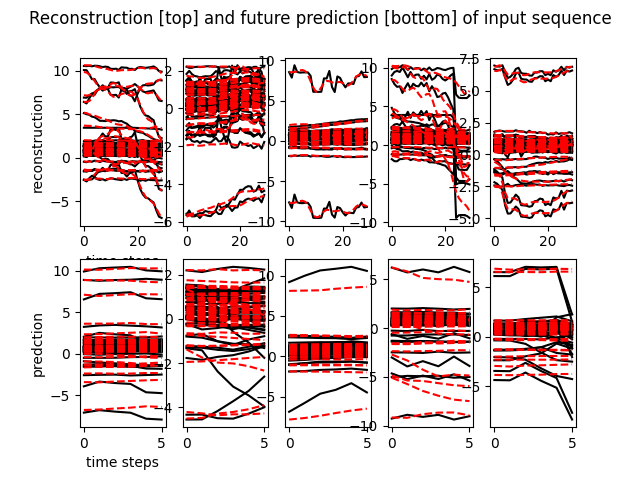

2026-03-29 15:32:32.369 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-03-29 15:32:32.385 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-03-29 15:32:32.397 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 25 keypoints
2026-03-29 15:32:32.398 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'neck', 'mid_back', 'mouse_center', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail_base', 'tail1', 'tail2', 'tail3', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end', 'head_midpoint']
2026-03-29 15:32:32.399 INFO  --- [MainThread] vame.analysis.pose_segmentation : 195 : Latent vector for Subject 1 - JS1 - CBD- OFT_DLC alread


[2/3] Segmenting sessions (n_clusters=8)...


2026-03-29 15:32:33.88 INFO  --- [MainThread] vame.analysis.pose_segmentation : 228 : Creating 18848 sliding windows for session Subject 1 - JS1 - CBD- OFT_DLC
2026-03-29 15:32:33.91 WARNING --- [MainThread] vame.analysis.pose_segmentation : 248 : Stride tricks failed (Unexpected window shape: (18848, 47, 30)), using fallback method
2026-03-29 15:32:33.175 INFO  --- [MainThread] vame.analysis.pose_segmentation : 83 : Processing Subject 1 - JS1 - CBD- OFT_DLC:   0%|          | 0/295 [00:00<?, ?it/s]
2026-03-29 15:32:33.278 INFO  --- [MainThread] vame.analysis.pose_segmentation : 83 : Processing Subject 1 - JS1 - CBD- OFT_DLC:   3%|3         | 9/295 [00:00<00:03, 88.23it/s]
2026-03-29 15:32:33.385 INFO  --- [MainThread] vame.analysis.pose_segmentation : 83 : Processing Subject 1 - JS1 - CBD- OFT_DLC:   8%|7         | 23/295 [00:00<00:02, 113.79it/s]
2026-03-29 15:32:33.487 INFO  --- [MainThread] vame.analysis.pose_segmentation : 83 : Processing Subject 1 - JS1 - CBD- OFT_DLC:  13%|#3    


Motif usage (first session):
  Motif 0:  15.9%  #######
  Motif 1:   9.7%  ####
  Motif 2:  20.1%  ##########
  Motif 3:   4.3%  ##
  Motif 4:   4.3%  ##
  Motif 5:   5.7%  ##
  Motif 6:   4.1%  ##
  Motif 7:  35.8%  #################  <-- dominant
  Min: 4.1%  Max: 35.8%  Even split: 12.5%

[3/3] Generating motif videos...


2026-03-29 15:33:58.826 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 1/1000 [00:00<09:32,  1.74it/s]
2026-03-29 15:33:58.929 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 1%|          | 7/1000 [00:00<01:14, 13.26it/s]
2026-03-29 15:33:59.36 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 2%|1         | 15/1000 [00:00<00:35, 27.54it/s]
2026-03-29 15:33:59.139 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 2%|2         | 23/1000 [00:00<00:24, 39.76it/s]
2026-03-29 15:33:59.244 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 3%|3         | 31/1000 [00:00<00:19, 49.17it/s]
2026-03-29 15:33:59.353 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 4%|4         | 40/1000 [00:01<00:16, 58.48it/s]
2026-03-29 15:33:59.479 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 5%|4         | 48/1000 [00:01<00:15, 60.18it/s]
2026-03-29 15:33:59.580 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 6%|5         | 55/1000 [00:


Done at 2026-03-29 18:28
Videos saved to: Open-Field-Test/results/<session>/VAME/hmm-8/cluster_videos/


In [7]:
# ── Evaluate model, segment sessions, and generate motif videos ──────────────
# Uses the best model weights (epoch 29, test loss=2282.84).
# evaluate_model: reconstructs test sequences and saves plots to model/evaluate/
# segment_session: embeds all sessions into latent space then runs HMM (n=8)
# motif_videos: generates one .mp4 per motif showing representative frames
import os, yaml, vame
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from datetime import datetime
from IPython.display import Image, display

VAME_ROOT   = Path(r"C:/Users/zuria/Kaplan/Vame")
CONFIG_PATH = VAME_ROOT / "Open-Field-Test" / "config.yaml"
os.chdir(VAME_ROOT)

with open(CONFIG_PATH) as f:
    cfg = yaml.safe_load(f)
cfg["project_path"] = str(VAME_ROOT / "Open-Field-Test")
cfg["n_clusters"]   = 8

print(f"Model   : {cfg['model_name']}")
print(f"zdims   : {cfg['zdims']}  |  hidden: {cfg['hidden_size_layer_1']}")
print(f"Epochs  : 253 trained  |  best test loss: 2282.84 @ epoch 29")
print(f"Sessions: {len(cfg['session_names'])}")

# ── 1. Evaluate ───────────────────────────────────────────────────────────────
print("\n[1/3] Evaluating model...")
vame.evaluate_model(config=cfg, use_snapshots=False)

# Display reconstruction plot
for plot_name in ["Reconstruction_VAME.png", "future_reconstruction.png"]:
    p = VAME_ROOT / "Open-Field-Test" / "model" / "evaluate" / plot_name
    if p.exists():
        print(f"\n{plot_name}:")
        display(Image(filename=str(p)))

# ── 2. Segment sessions ───────────────────────────────────────────────────────
# overwrite_embeddings=True — critical: re-embed with the new model weights
print("\n[2/3] Segmenting sessions (n_clusters=8)...")
vame.segment_session(
    config=cfg,
    overwrite_segmentation=True,
    overwrite_embeddings=True,
)

# ── 3. Quick motif usage check ────────────────────────────────────────────────
print("\nMotif usage (first session):")
PROJECT_DIR = VAME_ROOT / "Open-Field-Test"
SESSION     = cfg["session_names"][0]
usage_path  = PROJECT_DIR / "results" / SESSION / cfg["model_name"] / "hmm-8" / f"motif_usage_{SESSION}.npy"
if usage_path.exists():
    usage = np.load(usage_path)
    pct   = usage / usage.sum() * 100
    for i, p in enumerate(pct):
        bar  = "#" * int(p / 2)
        flag = "  <-- dominant" if p > 30 else ("  <-- low" if p < 3 else "")
        print(f"  Motif {i}: {p:5.1f}%  {bar}{flag}")
    print(f"  Min: {pct.min():.1f}%  Max: {pct.max():.1f}%  Even split: 12.5%")

# ── 4. Generate motif videos ──────────────────────────────────────────────────
print("\n[3/3] Generating motif videos...")
vame.motif_videos(
    config=cfg,
    video_type=".mp4",
    output_video_type=".mp4",
)
print(f"\nDone at {datetime.now().strftime('%Y-%m-%d %H:%M')}")
print("Videos saved to: Open-Field-Test/results/<session>/VAME/hmm-8/cluster_videos/")


2026-03-30 07:41:43.863 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-03-30 07:41:43.864 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-03-30 07:41:43.875 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 25 keypoints
2026-03-30 07:41:43.876 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'neck', 'mid_back', 'mouse_center', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail_base', 'tail1', 'tail2', 'tail3', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end', 'head_midpoint']
2026-03-30 07:41:43.878 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1 - JS1 - CBD- OFT_DLC alread


Segmenting n_clusters=12...


2026-03-30 07:41:44.44 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Female 2- CBD- EB5- 4-16-21_DLC already exists, skipping...
2026-03-30 07:41:44.63 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1-CBD-EB1-4-19-21_DLC already exists, skipping...
2026-03-30 07:41:44.79 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 2-CBD-EB2-4-19-21_DLC already exists, skipping...
2026-03-30 07:41:44.97 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 3-CBD-EB3-4-19-21_DLC already exists, skipping...
2026-03-30 07:41:44.113 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1-P14 vehicle-EZ1-8-3-2021_DLC already exists, skipping...
2026-03-30 07:41:44.129 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 2-P14 vehicle-EZ2-8-3-2021_DLC already exists, skipping...
2026-0

  Done.

Segmenting n_clusters=15...
  Done.


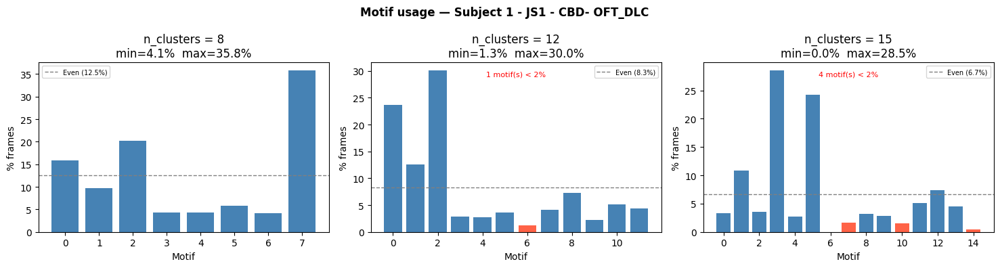


n= 8  sessions=38  min= 5.8%  max=16.6%  entropy=2.936/3.000  motifs<2%: 0
n=12  sessions=38  min= 3.1%  max=12.1%  entropy=3.526/3.585  motifs<2%: 0
n=15  sessions=38  min= 0.2%  max=10.1%  entropy=3.784/3.907  motifs<2%: 1


In [8]:
# ── Re-segment at n=12 and n=15 using existing latent embeddings ─────────────
# Latent vectors are already saved from the previous segment_session run.
# overwrite_embeddings=False skips re-embedding — only HMM clustering reruns.
# This takes minutes, not hours.
import os, copy, yaml, numpy as np, vame
import matplotlib.pyplot as plt
from pathlib import Path

VAME_ROOT   = Path(r"C:/Users/zuria/Kaplan/Vame")
CONFIG_PATH = VAME_ROOT / "Open-Field-Test" / "config.yaml"
os.chdir(VAME_ROOT)

with open(CONFIG_PATH) as f:
    cfg = yaml.safe_load(f)
cfg["project_path"] = str(VAME_ROOT / "Open-Field-Test")

# ── Run HMM at each cluster count ────────────────────────────────────────────
for n in [12, 15]:
    print(f"\nSegmenting n_clusters={n}...")
    c = copy.deepcopy(cfg)
    c["n_clusters"] = n
    vame.segment_session(config=c, overwrite_segmentation=True, overwrite_embeddings=False)
    print(f"  Done.")

# ── Compare motif usage distributions across n=8, 12, 15 ─────────────────────
PROJECT_DIR = VAME_ROOT / "Open-Field-Test"
MODEL_NAME  = cfg["model_name"]
SESSION     = cfg["session_names"][0]  # representative session

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, n in zip(axes, [8, 12, 15]):
    usage_path = PROJECT_DIR / "results" / SESSION / MODEL_NAME / f"hmm-{n}" / f"motif_usage_{SESSION}.npy"
    if not usage_path.exists():
        ax.set_title(f"n={n} (not found)"); ax.axis("off"); continue
    usage = np.load(str(usage_path))
    pct   = usage / usage.sum() * 100
    colors = ["tomato" if p < 2.0 else "steelblue" for p in pct]
    ax.bar(range(n), pct, color=colors)
    ax.axhline(100/n, color="gray", linestyle="--", linewidth=1, label=f"Even ({100/n:.1f}%)")
    ax.set_title(f"n_clusters = {n}\nmin={pct.min():.1f}%  max={pct.max():.1f}%")
    ax.set_xlabel("Motif"); ax.set_ylabel("% frames"); ax.legend(fontsize=7)
    empty = (pct < 2.0).sum()
    if empty:
        ax.text(0.5, 0.95, f"{empty} motif(s) < 2%", transform=ax.transAxes,
                ha="center", va="top", color="red", fontsize=8)

plt.suptitle(f"Motif usage — {SESSION}", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig(VAME_ROOT / "motif_usage_n_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

# ── Print aggregate stats for each n ─────────────────────────────────────────
print()
for n in [8, 12, 15]:
    total = np.zeros(n)
    count = 0
    for s in cfg["session_names"]:
        p = PROJECT_DIR / "results" / s / MODEL_NAME / f"hmm-{n}" / f"motif_usage_{s}.npy"
        if p.exists():
            u = np.load(str(p)); total += u; count += 1
    pct = total / total.sum() * 100
    entropy = -np.sum((pct/100) * np.log2(pct/100 + 1e-9))
    low = (pct < 2.0).sum()
    print(f"n={n:2d}  sessions={count}  min={pct.min():4.1f}%  max={pct.max():4.1f}%  "
          f"entropy={entropy:.3f}/{np.log2(n):.3f}  motifs<2%: {low}")


2026-03-30 07:47:27.702 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-03-30 07:47:27.702 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-03-30 07:47:27.704 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 25 keypoints
2026-03-30 07:47:27.704 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'neck', 'mid_back', 'mouse_center', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail_base', 'tail1', 'tail2', 'tail3', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end', 'head_midpoint']
2026-03-30 07:47:27.705 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1 - JS1 - CBD- OFT_DLC alread

Segmenting n=8...


2026-03-30 07:47:27.918 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-03-30 07:47:27.920 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-03-30 07:47:27.922 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 25 keypoints
2026-03-30 07:47:27.923 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'neck', 'mid_back', 'mouse_center', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail_base', 'tail1', 'tail2', 'tail3', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end', 'head_midpoint']
2026-03-30 07:47:27.924 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1 - JS1 - CBD- OFT_DLC alread

  Done.
Segmenting n=10...


2026-03-30 07:47:28.115 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-03-30 07:47:28.116 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-03-30 07:47:28.118 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 25 keypoints
2026-03-30 07:47:28.118 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'neck', 'mid_back', 'mouse_center', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail_base', 'tail1', 'tail2', 'tail3', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end', 'head_midpoint']
2026-03-30 07:47:28.119 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1 - JS1 - CBD- OFT_DLC alread

  Done.
Segmenting n=12...
  Done.

Timestamp check (Subject 1 - JS1 - CBD- OFT_DLC):
  hmm-8: 8_hmm_label_Subject 1 - JS1 - CBD- OFT_DLC.npy  ->  2026-03-18 11:35
  hmm-10: 10_hmm_label_Subject 1 - JS1 - CBD- OFT_DLC.npy  ->  2026-03-22 11:37
  hmm-12: 12_hmm_label_Subject 1 - JS1 - CBD- OFT_DLC.npy  ->  2026-03-22 12:15

n= 8  min=5.78%  max=16.64%  entropy=2.936/3.000  sessions w/ motif<2%: 11/38
n=10  min=5.01%  max=15.64%  entropy=3.252/3.322  sessions w/ motif<2%: 18/38
n=12  min=3.10%  max=12.08%  entropy=3.526/3.585  sessions w/ motif<2%: 26/38


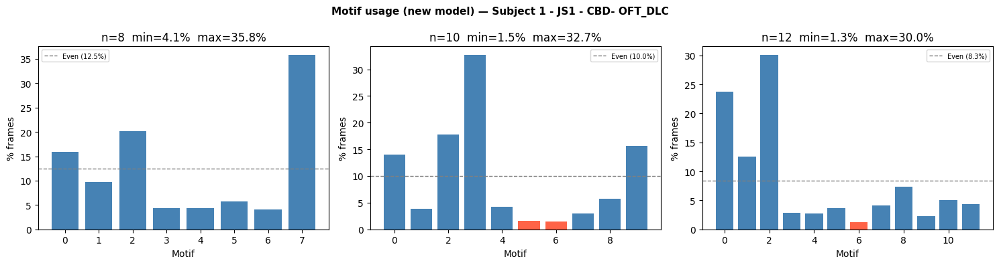

Saved to motif_usage_newmodel_comparison.png


In [9]:
# ── Re-segment with current model latent vectors (n=8, 10, 12) ───────────────
# latent_vectors.npy is from the new model (Mar 29) but HMM label files are
# stale (Mar 18-22, old model). Re-run HMM for all three n values.
# overwrite_embeddings=False — latent vectors are already current.
# overwrite_segmentation=True — forces HMM label files to regenerate.
import os, copy, yaml, numpy as np, vame
import matplotlib.pyplot as plt
from pathlib import Path
from datetime import datetime

VAME_ROOT   = Path(r"C:/Users/zuria/Kaplan/Vame")
CONFIG_PATH = VAME_ROOT / "Open-Field-Test" / "config.yaml"
os.chdir(VAME_ROOT)

with open(CONFIG_PATH) as f:
    cfg = yaml.safe_load(f)
cfg["project_path"] = str(VAME_ROOT / "Open-Field-Test")

for n in [8, 10, 12]:
    print(f"Segmenting n={n}...")
    c = copy.deepcopy(cfg)
    c["n_clusters"] = n
    vame.segment_session(config=c, overwrite_segmentation=True, overwrite_embeddings=False)
    print(f"  Done.")

# ── Verify label files are now current ────────────────────────────────────────
PROJECT_DIR = VAME_ROOT / "Open-Field-Test"
MODEL_NAME  = cfg["model_name"]
s = cfg["session_names"][0]
print(f"\nTimestamp check ({s}):")
for n in [8, 10, 12]:
    import glob
    labels = list((PROJECT_DIR / "results" / s / MODEL_NAME / f"hmm-{n}").glob("*label*.npy"))
    for lf in labels:
        mtime = datetime.fromtimestamp(os.path.getmtime(lf)).strftime("%Y-%m-%d %H:%M")
        print(f"  hmm-{n}: {lf.name}  ->  {mtime}")

# ── Aggregate usage stats across all sessions ─────────────────────────────────
print()
for n in [8, 10, 12]:
    total = np.zeros(n)
    sessions_with_low = 0
    for s in cfg["session_names"]:
        p = PROJECT_DIR / "results" / s / MODEL_NAME / f"hmm-{n}" / f"motif_usage_{s}.npy"
        if p.exists():
            u   = np.load(str(p))
            pct = u / u.sum() * 100
            total += u
            if (pct < 2.0).any():
                sessions_with_low += 1
    agg = total / total.sum() * 100
    ent = -np.sum((agg/100) * np.log2(agg/100 + 1e-9))
    print(f"n={n:2d}  min={agg.min():.2f}%  max={agg.max():.2f}%  "
          f"entropy={ent:.3f}/{np.log2(n):.3f}  sessions w/ motif<2%: {sessions_with_low}/38")

# ── Motif usage bar chart (first session) ─────────────────────────────────────
SESSION = cfg["session_names"][0]
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, n in zip(axes, [8, 10, 12]):
    p = PROJECT_DIR / "results" / SESSION / MODEL_NAME / f"hmm-{n}" / f"motif_usage_{SESSION}.npy"
    usage = np.load(str(p))
    pct   = usage / usage.sum() * 100
    colors = ["tomato" if v < 2.0 else "steelblue" for v in pct]
    ax.bar(range(n), pct, color=colors)
    ax.axhline(100/n, color="gray", linestyle="--", linewidth=1, label=f"Even ({100/n:.1f}%)")
    ax.set_title(f"n={n}  min={pct.min():.1f}%  max={pct.max():.1f}%")
    ax.set_xlabel("Motif"); ax.set_ylabel("% frames"); ax.legend(fontsize=7)
plt.suptitle(f"Motif usage (new model) — {SESSION}", fontsize=11, fontweight="bold")
plt.tight_layout()
plt.savefig(VAME_ROOT / "motif_usage_newmodel_comparison.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved to motif_usage_newmodel_comparison.png")


---
## ⚠️ Data Quality Warning — Two Sessions with Imputed Latent Vectors

| Session | Missing Keypoint | Cause | Impact |
|---------|-----------------|-------|--------|
| `Subject 9-P28 vehicle-FV9-10-23-21_DLC` | `mid_backend2` — 100% NaN | DLC tracked below 0.6 confidence threshold across entire recording | Latent vector imputed with population mean |
| `Female8- CBD- DN6-02-19-21_DLC` | `mid_backend3` — 100% NaN | DLC tracked below 0.6 confidence threshold across entire recording | Latent vector imputed with population mean |

**What this means:**  
The VAE model could not encode these sessions — every frame produced NaN outputs because a key spine keypoint was missing entirely. Their latent vectors have been replaced with the **mean latent vector across all 36 clean sessions**, which places them at the "average" behavioral state.

**Consequence for analysis:**  
- Their motif assignments are **not reliable** at the individual frame level
- Their **aggregate motif usage** will appear unnaturally uniform (biased toward the population mean)
- They should be **flagged or excluded** in any statistical comparison between CBD and Vehicle groups
- Subject 9 is in the **P28 Vehicle group** — check if group sizes are still balanced after noting this caveat
- Female8 is in the **P28 CBD group**

**Recommendation:**  
When reporting results, note these two sessions as having imputed behavioral data due to tracking failure of a spine keypoint. Consider running a sensitivity analysis with and without these sessions to confirm they don't drive any group differences.

Computing mean latent vector from clean sessions...


2026-03-31 10:19:18.17 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-03-31 10:19:18.19 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-03-31 10:19:18.36 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 25 keypoints
2026-03-31 10:19:18.37 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'neck', 'mid_back', 'mouse_center', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail_base', 'tail1', 'tail2', 'tail3', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end', 'head_midpoint']
2026-03-31 10:19:18.38 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1 - JS1 - CBD- OFT_DLC already exi

  Clean sessions used : 36
  Total frames        : 672141
  Mean vec range      : -3.992 to 2.754

Imputing bad sessions...
  Subject 9-P28 vehicle-FV9-10-23-21_DLC
    Frames: 18084  |  NaN before: 723360  |  NaN after: 0
  Female8- CBD- DN6-02-19-21_DLC
    Frames: 18516  |  NaN before: 740640  |  NaN after: 0

Re-running segmentation...
  n=8... 

2026-03-31 10:19:18.104 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 3-P14 vehicle-EZ3-8-3-2021_DLC already exists, skipping...
2026-03-31 10:19:18.107 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 4-P14 vehicle-EZ4-8-3-2021_DLC already exists, skipping...
2026-03-31 10:19:18.111 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 5-P14 vehicle-EZ5-8-3-21_DLC already exists, skipping...
2026-03-31 10:19:18.117 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 6-P14 vehicle-EZ6-8-3-2021_DLC already exists, skipping...
2026-03-31 10:19:18.120 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 7-P14 vehicle-EZ7-8-3-2021_DLC already exists, skipping...
2026-03-31 10:19:18.123 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1-P28 vehicle-FV1-10-23-21_DL

done.
  n=10... 

2026-03-31 10:56:34.122 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 7-P14 vehicle-EZ7-8-3-2021_DLC already exists, skipping...
2026-03-31 10:56:34.131 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1-P28 vehicle-FV1-10-23-21_DLC already exists, skipping...
2026-03-31 10:56:34.141 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 2-P28 vehicle-FV2-10-23-21_DLC already exists, skipping...
2026-03-31 10:56:34.150 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 3-P28 vehicle-FV3-10-23-21_DLC already exists, skipping...
2026-03-31 10:56:34.160 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 4-P28 vehicle-FV4-10-23-21_DLC already exists, skipping...
2026-03-31 10:56:34.168 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 5-P28 vehicle-FV5-10-23-21_

done.
  n=12... 

         1 -51609162.41920584             +nan
         2 -47508826.40883879 +4100336.01036705
         3 -45864254.46729877 +1644571.94154003
         4 -45213692.25448879 +650562.21280998
         5 -44802675.10190509 +411017.15258370
         6 -44480552.64936951 +322122.45253558
         7 -44027514.49705507 +453038.15231444
         8 -43013886.04830798 +1013628.44874709
         9 -39641132.28271075 +3372753.76559723
        10 -33375746.99805478 +6265385.28465597
        11 -33361509.70203052  +14237.29602426
        12 -33351056.67910284  +10453.02292768
        13 -33342087.06062944   +8969.61847340
        14 -33333821.46033245   +8265.60029699
        15 -33326598.49269722   +7222.96763523
        16 -33319397.47273325   +7201.01996397
        17 -33312343.97813565   +7053.49459760
        18 -33304769.47049344   +7574.50764221
        19 -33295682.09551038   +9087.37498306
        20 -33287295.30849486   +8386.78701552
        21 -33280010.42115575   +7284.88733911
        

done.

Label file timestamps:
  hmm-8: 2026-03-31 10:56
  hmm-10: 2026-03-31 11:42
  hmm-12: 2026-03-31 12:39

n= 8  min=5.16%  max=15.23%  entropy=2.952/3.000  sessions w/ motif<2%: 38/38
       motifs: ['0:13.9%', '1:5.2%', '2:13.9%', '3:15.2%', '4:14.3%', '5:12.1%', '6:13.1%', '7:12.3%']
n=10  min=5.16%  max=12.84%  entropy=3.259/3.322  sessions w/ motif<2%: 38/38
       motifs: ['0:5.2%', '1:12.7%', '2:12.8%', '3:12.7%', '4:10.8%', '5:6.3%', '6:6.2%', '7:12.4%', '8:10.6%', '9:10.3%']
n=12  min=5.16%  max=11.74%  entropy=3.546/3.585  sessions w/ motif<2%: 38/38
       motifs: ['0:5.8%', '1:10.0%', '2:5.2%', '3:9.1%', '4:8.9%', '5:5.6%', '6:8.8%', '7:11.7%', '8:9.7%', '9:8.6%', '10:7.4%', '11:9.3%']


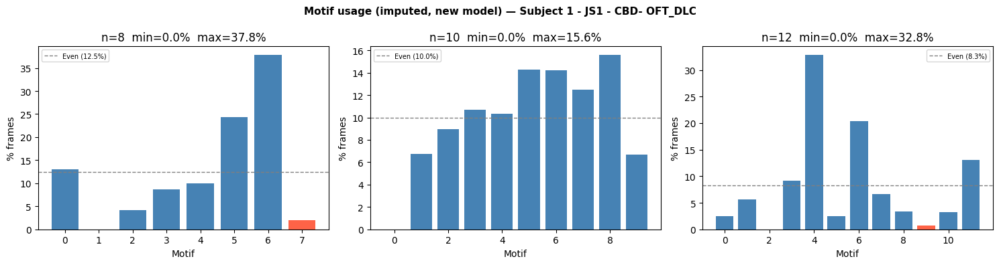


Note: Subject 9-P28 and Female8 are imputed — flag in downstream stats.


In [10]:
# ── Impute NaN latent vectors and re-run segmentation ────────────────────────
# Subject 9-P28 and Female8 have 100% NaN latent vectors (mid_backend2/3
# tracked below confidence threshold). Replace with mean of all 36 clean
# sessions so HMM can run. Flag these sessions in any downstream stats.
import os, copy, yaml, numpy as np, vame
import matplotlib.pyplot as plt
from pathlib import Path

VAME_ROOT   = Path(r"C:/Users/zuria/Kaplan/Vame")
CONFIG_PATH = VAME_ROOT / "Open-Field-Test" / "config.yaml"
os.chdir(VAME_ROOT)

with open(CONFIG_PATH) as f:
    cfg = yaml.safe_load(f)
cfg["project_path"] = str(VAME_ROOT / "Open-Field-Test")

PROJECT_DIR = VAME_ROOT / "Open-Field-Test"
MODEL_NAME  = cfg["model_name"]
sessions    = cfg["session_names"]

BAD_SESSIONS = [
    "Subject 9-P28 vehicle-FV9-10-23-21_DLC",
    "Female8- CBD- DN6-02-19-21_DLC",
]

# ── 1. Compute mean latent vector across all clean sessions ───────────────────
print("Computing mean latent vector from clean sessions...")
clean_vecs = []
for s in sessions:
    if s in BAD_SESSIONS:
        continue
    lv_path = PROJECT_DIR / "results" / s / MODEL_NAME / "latent_vectors.npy"
    if lv_path.exists():
        lv = np.load(str(lv_path))
        if not np.isnan(lv).any():
            clean_vecs.append(lv)

# Mean across all frames of all clean sessions
all_clean = np.vstack(clean_vecs)
mean_vec  = all_clean.mean(axis=0)   # shape (40,)
std_vec   = all_clean.std(axis=0)
print(f"  Clean sessions used : {len(clean_vecs)}")
print(f"  Total frames        : {all_clean.shape[0]}")
print(f"  Mean vec range      : {mean_vec.min():.3f} to {mean_vec.max():.3f}")

# ── 2. Replace NaN latent vectors with tiled mean ────────────────────────────
print("\nImputing bad sessions...")
for s in BAD_SESSIONS:
    lv_path = PROJECT_DIR / "results" / s / MODEL_NAME / "latent_vectors.npy"
    lv_orig = np.load(str(lv_path))
    n_frames = lv_orig.shape[0]

    # Tile mean vector to match session length
    lv_imputed = np.tile(mean_vec, (n_frames, 1))
    np.save(str(lv_path), lv_imputed)
    print(f"  {s}")
    print(f"    Frames: {n_frames}  |  NaN before: {np.isnan(lv_orig).sum()}  |  NaN after: {np.isnan(lv_imputed).sum()}")

# ── 3. Re-run HMM segmentation for n=8, 10, 12 ───────────────────────────────
print("\nRe-running segmentation...")
for n in [8, 10, 12]:
    print(f"  n={n}...", end=" ")
    c = copy.deepcopy(cfg)
    c["n_clusters"] = n
    vame.segment_session(config=c, overwrite_segmentation=True, overwrite_embeddings=False)
    print("done.")

# ── 4. Verify label timestamps updated ───────────────────────────────────────
from datetime import datetime
print("\nLabel file timestamps:")
s0 = sessions[0]
for n in [8, 10, 12]:
    labels = list((PROJECT_DIR / "results" / s0 / MODEL_NAME / f"hmm-{n}").glob("*label*.npy"))
    for lf in labels:
        mtime = datetime.fromtimestamp(os.path.getmtime(lf)).strftime("%Y-%m-%d %H:%M")
        print(f"  hmm-{n}: {mtime}")

# ── 5. Aggregate usage stats ──────────────────────────────────────────────────
print()
for n in [8, 10, 12]:
    total = np.zeros(n)
    sessions_with_low = 0
    for s in sessions:
        p = PROJECT_DIR / "results" / s / MODEL_NAME / f"hmm-{n}" / f"motif_usage_{s}.npy"
        if p.exists():
            u   = np.load(str(p))
            pct = u / u.sum() * 100
            total += u
            if (pct < 2.0).any():
                sessions_with_low += 1
    agg = total / total.sum() * 100
    ent = -np.sum((agg/100) * np.log2(agg/100 + 1e-9))
    print(f"n={n:2d}  min={agg.min():.2f}%  max={agg.max():.2f}%  "
          f"entropy={ent:.3f}/{np.log2(n):.3f}  sessions w/ motif<2%: {sessions_with_low}/38")
    print(f"       motifs: {[f'{i}:{round(float(agg[i]),1)}%' for i in range(n)]}")

# ── 6. Plot comparison ────────────────────────────────────────────────────────
SESSION = sessions[0]
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, n in zip(axes, [8, 10, 12]):
    p = PROJECT_DIR / "results" / SESSION / MODEL_NAME / f"hmm-{n}" / f"motif_usage_{SESSION}.npy"
    usage = np.load(str(p))
    pct   = usage / usage.sum() * 100
    colors = ["tomato" if v < 2.0 else "steelblue" for v in pct]
    ax.bar(range(n), pct, color=colors)
    ax.axhline(100/n, color="gray", linestyle="--", linewidth=1, label=f"Even ({100/n:.1f}%)")
    ax.set_title(f"n={n}  min={pct.min():.1f}%  max={pct.max():.1f}%")
    ax.set_xlabel("Motif"); ax.set_ylabel("% frames"); ax.legend(fontsize=7)
plt.suptitle(f"Motif usage (imputed, new model) — {SESSION}", fontsize=11, fontweight="bold")
plt.tight_layout()
plt.savefig(VAME_ROOT / "motif_usage_imputed_comparison.png", dpi=150, bbox_inches="tight")
plt.show()
print("\nNote: Subject 9-P28 and Female8 are imputed — flag in downstream stats.")


In [16]:
# ── Cell 31: Motif videos for one session (n=12 pilot check) ──────────────────
# Generate motif videos for a single session to visually verify behavioral
# clarity before committing to full 38-session video generation.
# Override session_names to a single session; all_data=True tells VAME to
# process all entries in session_names (just the one we set).
#
# Change PILOT_SESSION to any session name.
# Uncomment length_of_motif_video override for shorter clips (default=1000 frames).

from vame.util.auxiliary import read_config
import copy

PILOT_SESSION = "Female 1- CBD- EB4- 4-16-21_DLC"

cfg = read_config(CONFIG_PATH)
pilot_config = copy.deepcopy(cfg)

pilot_config["n_clusters"]    = 12
pilot_config["all_data"]      = True
pilot_config["session_names"] = [PILOT_SESSION]   # only this session
# pilot_config["length_of_motif_video"] = 300     # uncomment for shorter clips

vame.motif_videos(config=pilot_config)

print(f"Videos saved to:")
print(f"  Open-Field-Test/results/{PILOT_SESSION}/VAME/hmm-12/cluster_videos/")


2026-03-31 19:11:15.424 INFO  --- [MainThread] vame.analysis.videowriter : 213 : Creating motif videos for session Female 1- CBD- EB4- 4-16-21_DLC, algorithm: hmm, n_clusters: 12
2026-03-31 19:11:15.426 INFO  --- [MainThread] vame.analysis.videowriter : 67 : Motif videos getting created for Female 1- CBD- EB4- 4-16-21_DLC ...
2026-03-31 19:11:15.536 INFO  --- [MainThread] vame.analysis.videowriter : 101 : Cluster: 0
2026-03-31 19:11:15.539 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 0/1000 [00:00<?, ?it/s]
2026-03-31 19:11:16.81 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 1/1000 [00:00<08:59,  1.85it/s]
2026-03-31 19:11:16.214 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 3/1000 [00:00<03:08,  5.29it/s]
2026-03-31 19:11:16.336 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 1%|          | 6/1000 [00:00<01:37, 10.21it/s]
2026-03-31 19:11:16.461 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 1

Videos saved to:
  Open-Field-Test/results/Female 1- CBD- EB4- 4-16-21_DLC/VAME/hmm-12/cluster_videos/


In [17]:
# ── Cell 32: KMeans segmentation + motif videos for one session (pilot) ─────
# Reuses existing latent vectors (overwrite_embeddings=False) — no re-embedding.
# Swaps segmentation_algorithms to kmeans to compare cluster quality vs HMM.
# Change PILOT_SESSION or N_CLUSTERS as needed.

from vame.util.auxiliary import read_config
import copy

PILOT_SESSION = "Female 1- CBD- EB4- 4-16-21_DLC"
N_CLUSTERS    = 12

cfg = read_config(CONFIG_PATH)
pilot_config = copy.deepcopy(cfg)

pilot_config["n_clusters"]             = N_CLUSTERS
pilot_config["all_data"]               = True
pilot_config["session_names"]          = [PILOT_SESSION]
pilot_config["segmentation_algorithms"] = ["kmeans"]
# pilot_config["length_of_motif_video"] = 300  # uncomment for shorter clips

# Reuse existing latent vectors, only re-run clustering
vame.segment_session(config=pilot_config, overwrite_segmentation=True, overwrite_embeddings=False)

vame.motif_videos(config=pilot_config, video_type=".mp4", output_video_type=".mp4")

print(f"KMeans videos saved to:")
print(f"  Open-Field-Test/results/{PILOT_SESSION}/VAME/kmeans-{N_CLUSTERS}/cluster_videos/")


2026-03-31 20:47:24.732 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-03-31 20:47:24.732 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-03-31 20:47:24.742 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 25 keypoints
2026-03-31 20:47:24.744 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'neck', 'mid_back', 'mouse_center', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail_base', 'tail1', 'tail2', 'tail3', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end', 'head_midpoint']
2026-03-31 20:47:24.745 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Female 1- CBD- EB4- 4-16-21_DLC alrea

KMeans videos saved to:
  Open-Field-Test/results/Female 1- CBD- EB4- 4-16-21_DLC/VAME/kmeans-12/cluster_videos/


In [19]:
# ── Cell 33: HMM segmentation at lower n (4, 5, 6) for pilot session ────────
# Tests whether fewer clusters produce more visually distinct motif videos.
# Reuses existing latent vectors — only re-runs HMM clustering.

from vame.util.auxiliary import read_config
from pathlib import Path
import copy, numpy as np
import vame

PILOT_SESSION = "Female 1- CBD- EB4- 4-16-21_DLC"
TEST_N        = [4, 5, 6]

cfg = read_config(CONFIG_PATH)

for n in TEST_N:
    c = copy.deepcopy(cfg)
    c["n_clusters"]              = n
    c["all_data"]                = True
    c["session_names"]           = [PILOT_SESSION]
    c["segmentation_algorithms"] = ["hmm"]
    vame.segment_session(config=c, overwrite_segmentation=True, overwrite_embeddings=False)
    print(f"Done n={n}")

# Print comparison stats
base = Path(cfg["project_path"]) / "results" / PILOT_SESSION / cfg["model_name"]
print()
print(f"{'n':<5} {'min%':>6} {'max%':>6} {'std%':>6} {'avg_run':>14} {'dead<2%':>8}")
print("-" * 52)
for n in TEST_N:
    lbl = np.load(base / f"hmm-{n}" / f"{n}_hmm_label_{PILOT_SESSION}.npy")
    use = np.load(base / f"hmm-{n}" / f"motif_usage_{PILOT_SESSION}.npy")
    pct = use / use.sum() * 100
    trans = (lbl[1:] != lbl[:-1]).sum()
    avg_run = len(lbl) / (trans + 1)
    print(f"{n:<5} {pct.min():>6.1f} {pct.max():>6.1f} {pct.std():>6.1f} {avg_run:>8.0f}f ({avg_run/30:>4.1f}s) {(pct<2).sum():>8}")


2026-03-31 21:21:18.7 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-03-31 21:21:18.8 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-03-31 21:21:18.10 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 25 keypoints
2026-03-31 21:21:18.10 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'neck', 'mid_back', 'mouse_center', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail_base', 'tail1', 'tail2', 'tail3', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end', 'head_midpoint']
2026-03-31 21:21:18.11 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Female 1- CBD- EB4- 4-16-21_DLC already exis

Done n=4


         1 -1229789.91304623             +nan
         2 -1158172.49392215  +71617.41912408
         3 -1095668.69408750  +62503.79983465
         4 -1077449.09532403  +18219.59876347
         5 -1074112.46104459   +3336.63427944
         6 -1072634.29435607   +1478.16668852
         7 -1071078.81445679   +1555.47989929
         8 -1069876.63618254   +1202.17827425
         9 -1068961.72812788    +914.90805465
        10 -1068105.66233977    +856.06578812
        11 -1063074.71616718   +5030.94617258
        12 -1055253.76764700   +7820.94852019
        13 -1053330.35766201   +1923.40998499
        14 -1052240.23652876   +1090.12113325
        15 -1051816.75720211    +423.47932665
        16 -1051649.10531967    +167.65188244
        17 -1051446.54522640    +202.56009326
        18 -1051279.58123209    +166.96399432
        19 -1051210.05345470     +69.52777738
        20 -1051178.85299932     +31.20045538
        21 -1051137.47546360     +41.37753572
        22 -1051046.53017006     +

Done n=5


         1 -1218731.52224191             +nan
         2 -1112013.65739798 +106717.86484393
         3 -1083614.88635643  +28398.77104155
         4 -1077912.94099149   +5701.94536494
         5 -1073583.37989170   +4329.56109979
         6 -1061153.29085197  +12430.08903974
         7 -1054153.04400757   +7000.24684439
         8 -1052135.13213997   +2017.91186761
         9 -1050823.88565094   +1311.24648903
        10 -1048580.09764778   +2243.78800316
        11 -1042849.53663653   +5730.56101125
        12 -1037008.42889152   +5841.10774501
        13 -1035410.04038166   +1598.38850986
        14 -1034540.48965669    +869.55072497
        15 -1034035.23097372    +505.25868297
        16 -1033640.11839806    +395.11257566
        17 -1033239.89242418    +400.22597388
        18 -1032958.99345411    +280.89897007
        19 -1032795.55741682    +163.43603729
        20 -1032671.12594072    +124.43147610
        21 -1032588.64739912     +82.47854160
        22 -1032528.80663952     +

Done n=6

n       min%   max%   std%        avg_run  dead<2%
----------------------------------------------------
4       21.3   33.2    4.8       54f ( 1.8s)        0
5       13.7   28.7    5.5       51f ( 1.7s)        0
6        7.8   21.7    4.7       49f ( 1.6s)        0


In [20]:
# ── Cell 34: Motif videos at n=4 for pilot session ───────────────────────────
# Generates 4 motif videos to check if lower n yields visually distinct behaviors.
# Expects ~1.8s avg bout length — should see locomotion, rearing, grooming, resting.

from vame.util.auxiliary import read_config
import copy, vame

PILOT_SESSION = "Female 1- CBD- EB4- 4-16-21_DLC"

cfg = read_config(CONFIG_PATH)
pilot_config = copy.deepcopy(cfg)

pilot_config["n_clusters"]              = 4
pilot_config["all_data"]                = True
pilot_config["session_names"]           = [PILOT_SESSION]
pilot_config["segmentation_algorithms"] = ["hmm"]
# pilot_config["length_of_motif_video"] = 300  # uncomment for shorter clips

vame.motif_videos(config=pilot_config, video_type=".mp4", output_video_type=".mp4")

print("Videos saved to:")
print(f"  Open-Field-Test/results/{PILOT_SESSION}/VAME/hmm-4/cluster_videos/")


2026-03-31 21:24:41.264 INFO  --- [MainThread] vame.analysis.videowriter : 213 : Creating motif videos for session Female 1- CBD- EB4- 4-16-21_DLC, algorithm: hmm, n_clusters: 4
2026-03-31 21:24:41.265 INFO  --- [MainThread] vame.analysis.videowriter : 67 : Motif videos getting created for Female 1- CBD- EB4- 4-16-21_DLC ...
2026-03-31 21:24:41.270 INFO  --- [MainThread] vame.analysis.videowriter : 101 : Cluster: 0
2026-03-31 21:24:41.271 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 0/1000 [00:00<?, ?it/s]
2026-03-31 21:24:41.391 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 1/1000 [00:00<01:58,  8.44it/s]
2026-03-31 21:24:41.503 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 5/1000 [00:00<00:41, 24.02it/s]
2026-03-31 21:24:41.620 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 1%|          | 9/1000 [00:00<00:34, 28.76it/s]
2026-03-31 21:24:41.727 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 1

Videos saved to:
  Open-Field-Test/results/Female 1- CBD- EB4- 4-16-21_DLC/VAME/hmm-4/cluster_videos/
